In [ ]:
# This is a notebook to train and evaluate everything in one notebook

In [2]:
from sklearn.model_selection import train_test_split
from pathlib import Path
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical, Sequence
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, concatenate, Conv2DTranspose, BatchNormalization, Activation, Dropout
from tensorflow import keras
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import json
import sys
sys.path.insert(0, '../shared/')
from predict import Predict

In [8]:
# Specify the dataset path in dataset_path
dataset_path = "E:/COMP 597/Dataset/"

#
fog_path = dataset_path + 'Fog/'
night_path = dataset_path + 'Night/'
rain_path = dataset_path + 'Rain/'
snow_path = dataset_path + 'Snow/'
#

#
fog_validation_rgb = list(Path(fog_path + 'RGB/Fog_Validation').glob('*.png'))
fog_validation_annotated = list(Path(fog_path + 'Annotated/Validation').glob('*_gt_labelColor.png'))
fog_training_rgb, fog_test_rgb = train_test_split(list(Path(fog_path + 'RGB/Fog_Train').glob('*.png')), test_size=0.1)
fog_training_annotated = [y for x in fog_training_rgb for y in
                      list(Path(fog_path + 'Annotated/Train').glob('*_gt_labelColor.png'))
                      if x.name.strip('_rgb_anon.png') == y.name.strip('_gt_labelColor.png')]
fog_test_annotated = [y for x in fog_test_rgb for y in list(Path(fog_path + 'Annotated/Train').glob('*_gt_labelColor.png'))
                  if x.name.strip('_rgb_anon.png') == y.name.strip('_gt_labelColor.png')]
#

#
night_validation_rgb = list(Path(night_path + 'RGB/Night_Validation').glob('*.png'))
night_validation_annotated = list(Path(night_path + 'Annotated/Validation').glob('*_gt_labelColor.png'))
night_training_rgb, night_test_rgb = train_test_split(list(Path(night_path + 'RGB/Night_Train').glob('*.png')), test_size=0.1)
night_training_annotated = [y for x in night_training_rgb for y in
                      list(Path(night_path + 'Annotated/Train').glob('*_gt_labelColor.png'))
                      if x.name.strip('_rgb_anon.png') == y.name.strip('_gt_labelColor.png')]
night_test_annotated = [y for x in night_test_rgb for y in list(Path(night_path + 'Annotated/Train').glob('*_gt_labelColor.png'))
                  if x.name.strip('_rgb_anon.png') == y.name.strip('_gt_labelColor.png')]
#

#
rain_validation_rgb = list(Path(rain_path + 'RGB/Rain_Validation').glob('*.png'))
rain_validation_annotated = list(Path(rain_path + 'Annotated/Validation').glob('*_gt_labelColor.png'))
rain_training_rgb, rain_test_rgb = train_test_split(list(Path(rain_path + 'RGB/Rain_Train').glob('*.png')), test_size=0.1)
rain_training_annotated = [y for x in rain_training_rgb for y in
                      list(Path(rain_path + 'Annotated/Train').glob('*_gt_labelColor.png'))
                      if x.name.strip('_rgb_anon.png') == y.name.strip('_gt_labelColor.png')]
rain_test_annotated = [y for x in rain_test_rgb for y in list(Path(rain_path + 'Annotated/Train').glob('*_gt_labelColor.png'))
                  if x.name.strip('_rgb_anon.png') == y.name.strip('_gt_labelColor.png')]
#

#
snow_validation_rgb = list(Path(snow_path + 'RGB/Snow_Validation').glob('*.png'))
snow_validation_annotated = list(Path(snow_path + 'Annotated/Validation').glob('*_gt_labelColor.png'))
snow_training_rgb, snow_test_rgb = train_test_split(list(Path(snow_path + 'RGB/Snow_Train').glob('*.png')), test_size=0.1)
snow_training_annotated = [y for x in snow_training_rgb for y in
                      list(Path(snow_path + 'Annotated/Train').glob('*_gt_labelColor.png'))
                      if x.name.strip('_rgb_anon.png') == y.name.strip('_gt_labelColor.png')]
snow_test_annotated = [y for x in snow_test_rgb for y in list(Path(snow_path + 'Annotated/Train').glob('*_gt_labelColor.png'))
                  if x.name.strip('_rgb_anon.png') == y.name.strip('_gt_labelColor.png')]
#


In [25]:
image_size = (256, 256)

#
fog_training_duo = [(x, y) for x, y in zip(fog_training_rgb, fog_training_annotated)]
fog_testing_duo = [(x, y) for x, y in zip(fog_test_rgb, fog_test_annotated)]
fog_validation_duo = [(x, y) for x, y in zip(fog_validation_rgb, fog_validation_annotated)]
#

#
night_training_duo = [(x, y) for x, y in zip(night_training_rgb, night_training_annotated)]
night_testing_duo = [(x, y) for x, y in zip(night_test_rgb, night_test_annotated)]
night_validation_duo = [(x, y) for x, y in zip(night_validation_rgb, night_validation_annotated)]
#

#
rain_training_duo = [(x, y) for x, y in zip(rain_training_rgb, rain_training_annotated)]
rain_testing_duo = [(x, y) for x, y in zip(rain_test_rgb, rain_test_annotated)]
rain_validation_duo = [(x, y) for x, y in zip(rain_validation_rgb, rain_validation_annotated)]
#

#
snow_training_duo = [(x, y) for x, y in zip(snow_training_rgb, snow_training_annotated)]
snow_testing_duo = [(x, y) for x, y in zip(snow_test_rgb, snow_test_annotated)]
snow_validation_duo = [(x, y) for x, y in zip(snow_validation_rgb, snow_validation_annotated)]
#

'Snow\\RGB\\Snow_Train\\GP040176_frame_000538_rgb_anon.png'

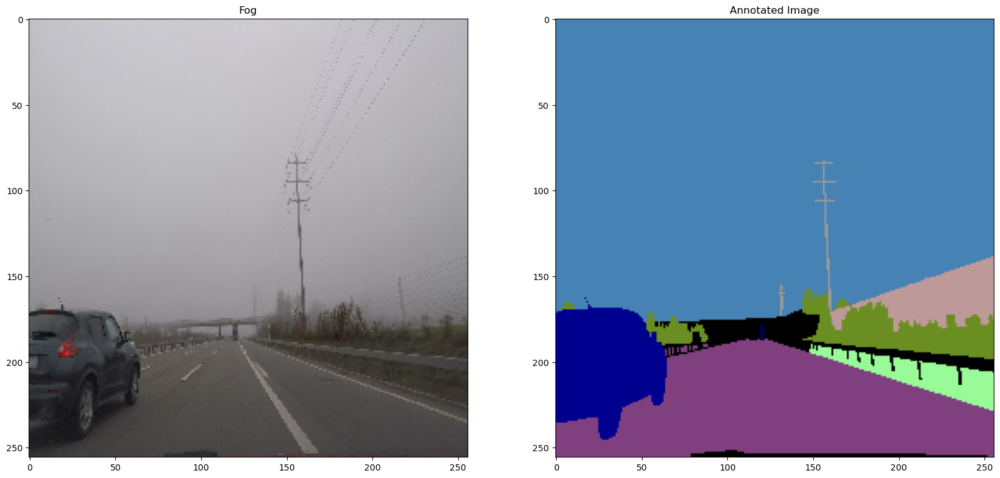

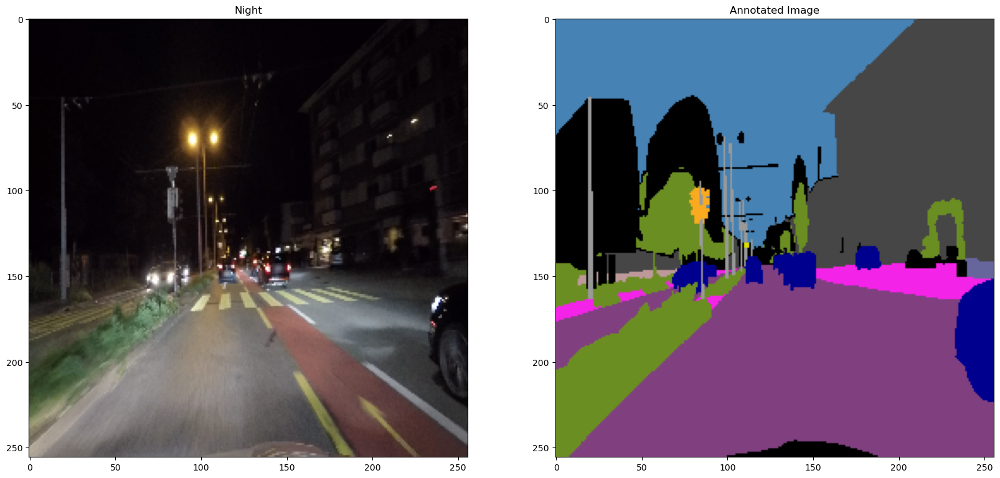

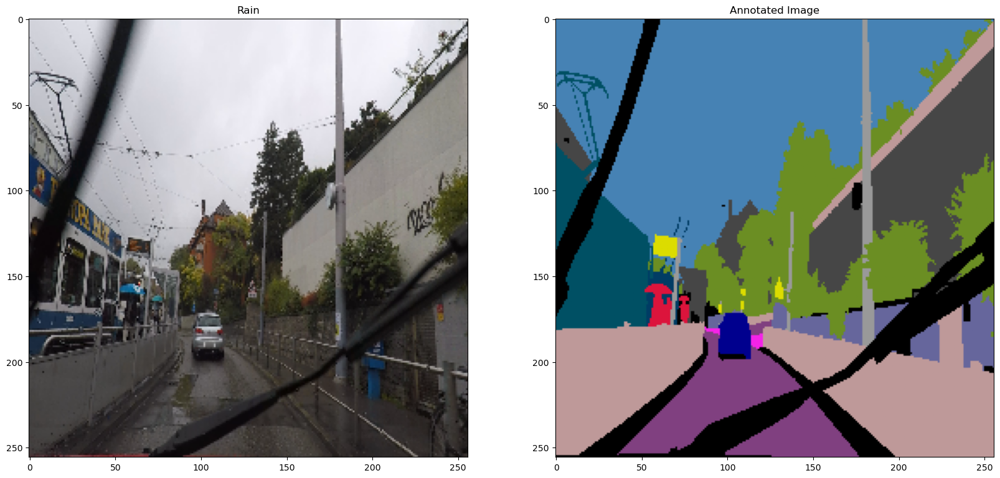

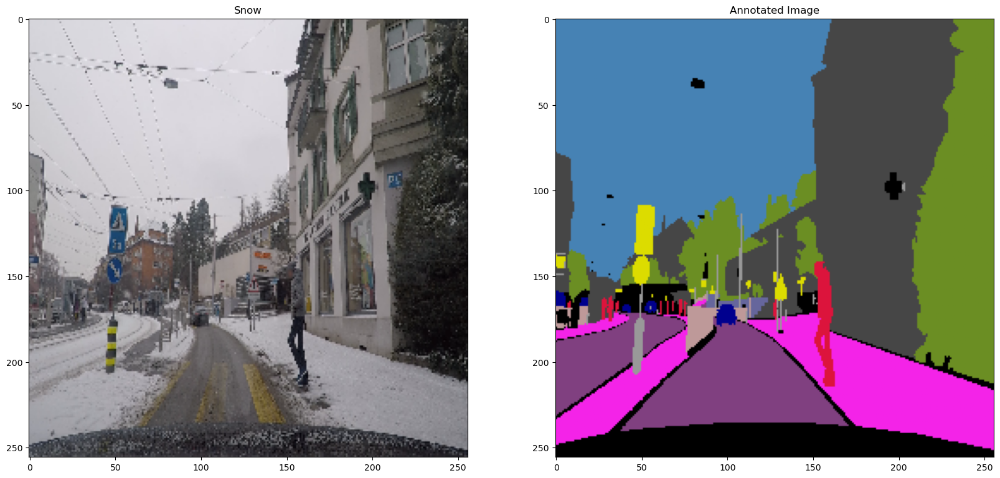

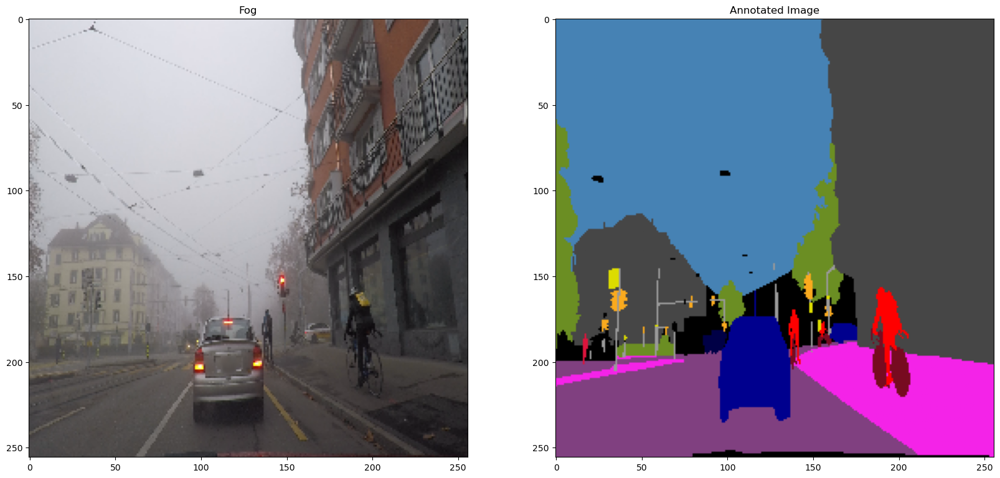

...

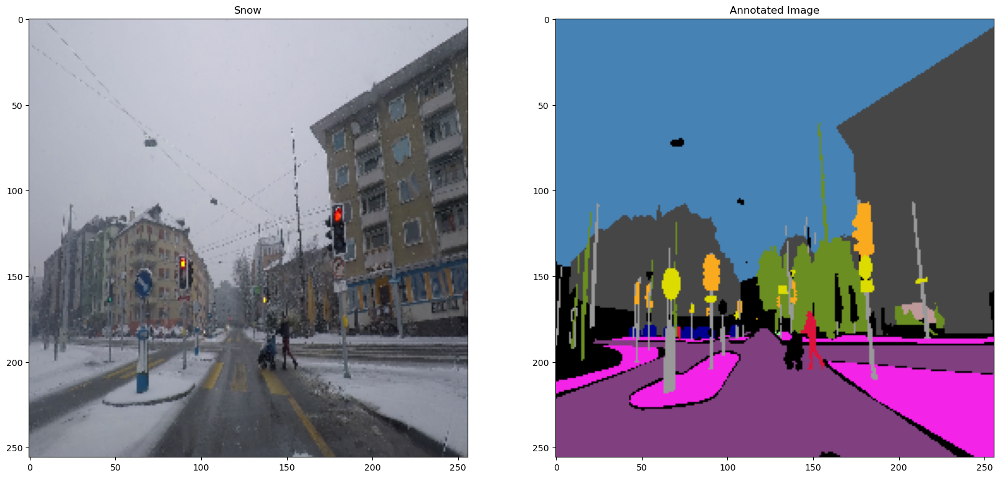

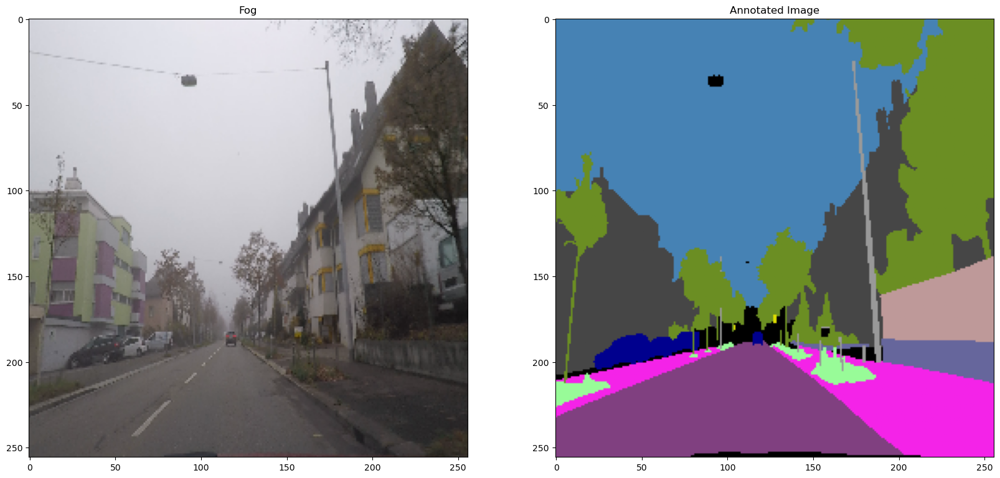

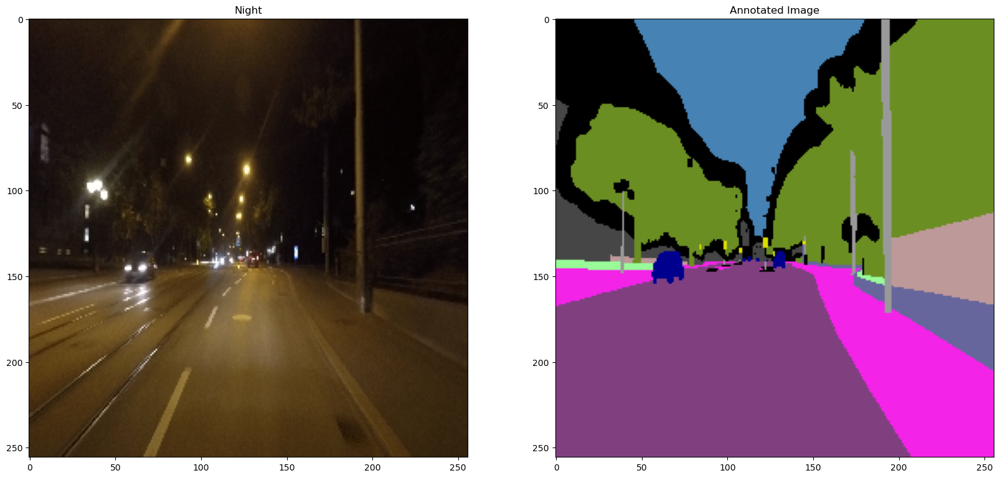

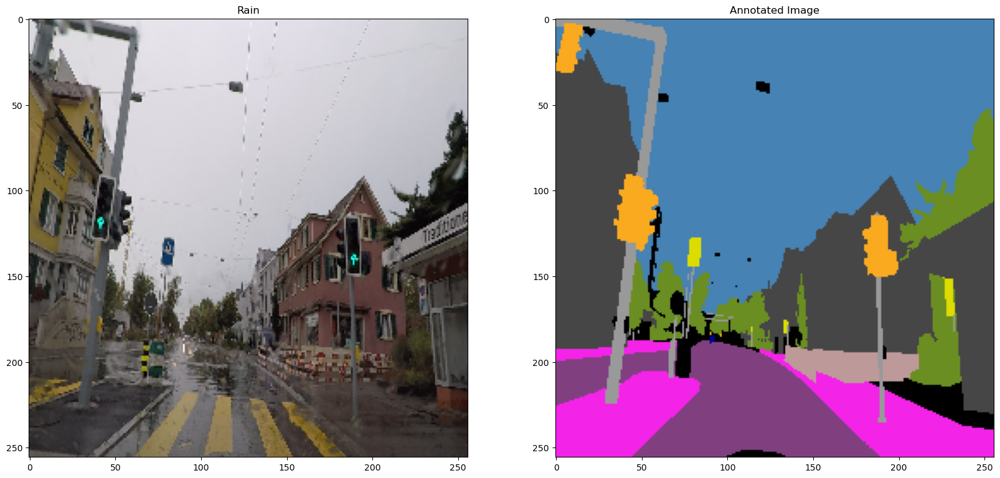

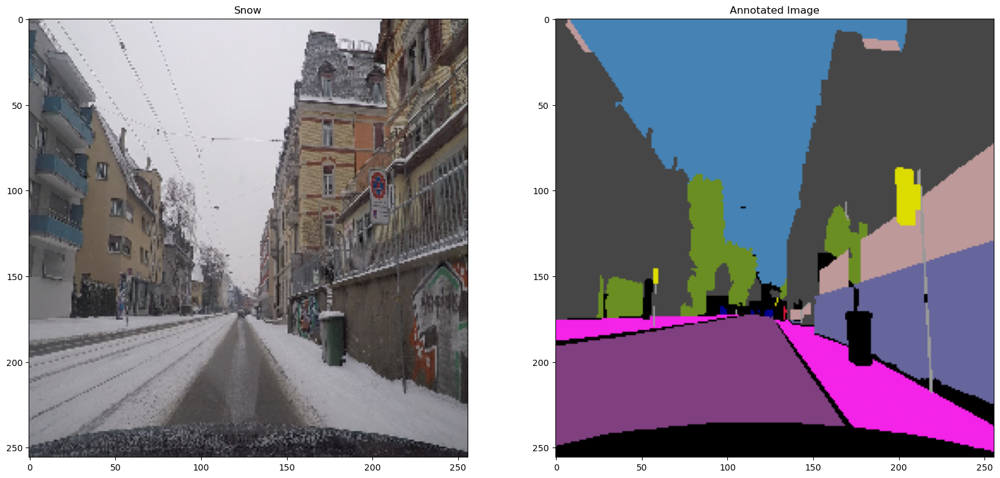

In [27]:
# Prints random rgb with annotations to make sure the right data is being used.

pictures = [fog_training_duo[6], night_training_duo[2], rain_training_duo[8], snow_training_duo[12],
           fog_testing_duo[9], night_testing_duo[15], rain_testing_duo[3], snow_testing_duo[11],
           fog_validation_duo[15], night_validation_duo[23], rain_validation_duo[21], snow_validation_duo[20]]

def show_sample(image, annotated_image, name):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_figheight(20)
    fig.set_figwidth(20)
    ax1.set_title(name)
    ax1.imshow(image / 255.)
    ax2.set_title('Annotated Image')
    ax2.imshow(annotated_image / 255.)

count = 1

for x in pictures:
    image = img_to_array(load_img(x[0], target_size=image_size))
    annotated_image = img_to_array(load_img(x[1], target_size =image_size))
    if count == 1:
        show_sample(image, annotated_image, 'Fog')
    elif count == 2:
        show_sample(image, annotated_image, 'Night')
    elif count == 3:
        show_sample(image, annotated_image, 'Rain')
    else:
        show_sample(image, annotated_image, 'Snow')
    if count == 4:
        count = 1
    else:
        count += 1

In [28]:
# Specify the class csv path in classes_df = pd.read_csv('PATH_HERE')

image_size = (256, 256)
classes_df = pd.read_csv("E:/Github/SemanticSegmentationOfLowVisibilityRoadways/segmentation/config/class_dict.csv")
classes = []
class_labels = []
for index, item in classes_df.iterrows():
    classes.append(np.array([item['r'], item['g'], item['b']]))
    class_labels.append(item['name'])
num_classes = len(classes)
classes

[array([0, 0, 0]),
 array([128,  64, 128]),
 array([244,  35, 232]),
 array([70, 70, 70]),
 array([102, 102, 156]),
 array([190, 153, 153]),
 array([153, 153, 153]),
 array([250, 170,  30]),
 array([220, 220,   0]),
 array([107, 142,  35]),
 array([152, 251, 152]),
 array([ 70, 130, 180]),
 array([220,  20,  60]),
 array([255,   0,   0]),
 array([  0,   0, 142]),
 array([ 0,  0, 70]),
 array([  0,  60, 100]),
 array([  0,  80, 100]),
 array([  0,   0, 230]),
 array([119,  11,  32])]

In [32]:
# This data generator will augment the images with a horizontal flip

from tensorflow.keras.utils import to_categorical, Sequence
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import random


def image_add_noise(img):
    image = img
    mean=0
    sigma=random.uniform(0.04, 0.08)
    noise = np.random.normal(mean, sigma, img.shape)
    mask_overflow_upper = image+noise >= 1.0
    mask_overflow_lower = image+noise < 0
    noise[mask_overflow_upper] = 1.0
    noise[mask_overflow_lower] = 0
    image += noise
    return image

def change_channel_ratio(img, channel='r', ratio=0.5):
    assert channel in 'rgb', "Value for channel: r|g|b"
    img = img.copy()
    ci = 'rgb'.index(channel)
    img[:, :, ci] *= ratio
    return img

# Converts annotations from RGB to 2D -> Array of size image_size x image_size which contains each pixel -> Each pixel will hold a class value
def rgb_to_2D_classes(annotated, class_map):
    label = np.zeros(annotated.shape[:2], dtype=np.uint8)
    for i, rgb in enumerate(class_map):
        label[(annotated == rgb).all(axis=2)] = i
    return label

# https://stanford.edu/~shervine/blog/keras-how-to-generate-data-on-the-fly
class DataGenerator(Sequence):
    'Generates data for Keras'

    def __init__(self, duo, classes, n_classes, batch_size=4, dim=(128, 128), shuffle=True):
        'Initialization'
        self.dim = dim
        self.duo = duo
        self.classes = classes
        self.n_classes = n_classes
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.duo) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]

        # Find list of IDs
        list_IDs_temp = [k for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.duo))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples'  # X : (n_samples, *dim, n_channels)
        # Initialization
        X = []
        y = []
        # Generate data
        for i in list_IDs_temp:
            # Store sample
            img = load_img(self.duo[i][0], target_size=self.dim)
            img = img_to_array(img) / 255. # Image to numpy array -> / 255. to get array values between 0 and 1
            img2 = np.fliplr(img)
            #img_noise = image_add_noise(img)
            #img_color_change = change_channel_ratio(img, ratio=0.6)
            X.append(img)
            X.append(img2)
            #X.append(img_noise)
            #X.append(img_color_change)

            label = load_img(self.duo[i][1], target_size=self.dim)
            label = img_to_array(label)
            label2 = np.fliplr(label)
            label = rgb_to_2D_classes(label, self.classes)
            label2 = rgb_to_2D_classes(label2, self.classes)
            label = to_categorical(label, num_classes=self.n_classes) # Converts to binary class matrix
            label2 = to_categorical(label2, num_classes=self.n_classes)
            y.append(label)
            y.append(label2)
            #y.append(label)
            #y.append(label)

        return np.array(X), np.array(y)

In [ ]:
# The models here are being loaded from a previously trained model.

In [42]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger, TensorBoard

fog_model = keras.models.load_model("E:/Github/SemanticSegmentationOfLowVisibilityRoadways/segmentation/fog/fog_saved_model")

for idx, x in enumerate(fog_model.layers[0].layers):
    if 'conv' in x.name and idx > 28:
        x.trainable = True

fog_model.compile(optimizer='adamax', loss='categorical_crossentropy' ,metrics=['accuracy', keras.metrics.OneHotMeanIoU(num_classes=num_classes)])

fog_my_callbacks = [
    CSVLogger("./fog/logs/log.csv", separator=",", append=False),
    ModelCheckpoint(filepath='./fog/fog-weights.h5', save_weights_only=True, monitor='val_accuracy', mode='max', save_best_only=True),
    TensorBoard(log_dir='./fog/logs')
]

fog_training_data = DataGenerator(fog_training_duo+fog_testing_duo,classes,num_classes,batch_size=3, dim=image_size ,shuffle=True)
fog_training_steps = fog_training_data.__len__()

fog_validation_data = DataGenerator(fog_validation_duo,classes,num_classes,batch_size=3, dim=image_size ,shuffle=True)
fog_validation_steps = fog_validation_data.__len__()

fog_model_train = fog_model.fit(fog_training_data, epochs=1, callbacks=fog_my_callbacks, validation_data=fog_validation_data, steps_per_epoch=fog_training_steps, validation_steps=fog_validation_steps)

133/133 [==============================] - ETA: 0s - loss: 0.2993 - accuracy: 0.9011 - one_hot_mean_io_u_9: 0.5451

INFO:tensorflow:Assets written to: ./fog\fog_model\assets


INFO:tensorflow:Assets written to: ./fog\fog_model\assets


133/133 [==============================] - 39s 287ms/step - loss: 0.2993 - accuracy: 0.9011 - one_hot_mean_io_u_9: 0.5451 - val_loss: 0.3238 - val_accuracy: 0.8972 - val_one_hot_mean_io_u_9: 0.5075


In [39]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger, TensorBoard

night_model = keras.models.load_model("E:/Github/SemanticSegmentationOfLowVisibilityRoadways/segmentation/night/night_saved_model")

for idx, x in enumerate(night_model.layers[0].layers):
    if 'conv' in x.name and idx > 28:
        x.trainable = True

night_model.compile(optimizer='adamax', loss='categorical_crossentropy' ,metrics=['accuracy', keras.metrics.OneHotMeanIoU(num_classes=num_classes)])

night_my_callbacks = [
    CSVLogger("./night/logs/log.csv", separator=",", append=False),
    ModelCheckpoint(filepath='./night/night-weights.h5', save_weights_only=True, monitor='val_accuracy', mode='max', save_best_only=True),
    TensorBoard(log_dir='./night/logs')
]

night_training_data = DataGenerator(night_training_duo+night_testing_duo,classes,num_classes,batch_size=3, dim=image_size ,shuffle=True)
night_training_steps = night_training_data.__len__()

night_validation_data = DataGenerator(night_validation_duo,classes,num_classes,batch_size=3, dim=image_size ,shuffle=True)
night_validation_steps = night_validation_data.__len__()

night_model_train = night_model.fit(night_training_data, epochs=1, callbacks=night_my_callbacks, validation_data=night_validation_data, steps_per_epoch=night_training_steps, validation_steps=night_validation_steps)

133/133 [==============================] - 35s 255ms/step - loss: 0.8073 - accuracy: 0.7131 - one_hot_mean_io_u_6: 0.2820 - val_loss: 0.9127 - val_accuracy: 0.6823 - val_one_hot_mean_io_u_6: 0.2481


In [40]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger, TensorBoard

rain_model = keras.models.load_model("E:/Github/SemanticSegmentationOfLowVisibilityRoadways/segmentation/rain/rain_saved_model")

for idx, x in enumerate(rain_model.layers[0].layers):
    if 'conv' in x.name and idx > 28:
        x.trainable = True

rain_model.compile(optimizer='adamax', loss='categorical_crossentropy' ,metrics=['accuracy', keras.metrics.OneHotMeanIoU(num_classes=num_classes)])

rain_my_callbacks = [
    CSVLogger("./rain/logs/log.csv", separator=",", append=False),
    ModelCheckpoint(filepath='./rain/rain-weights.h5', save_weights_only=True, monitor='val_accuracy', mode='max', save_best_only=True),
    TensorBoard(log_dir='./rain/logs')
]

rain_training_data = DataGenerator(rain_training_duo+rain_testing_duo,classes,num_classes,batch_size=3, dim=image_size ,shuffle=True)
rain_training_steps = rain_training_data.__len__()

rain_validation_data = DataGenerator(rain_validation_duo,classes,num_classes,batch_size=3, dim=image_size ,shuffle=True)
rain_validation_steps = rain_validation_data.__len__()

rain_model_train = rain_model.fit(rain_training_data, epochs=1, callbacks=rain_my_callbacks, validation_data=rain_validation_data, steps_per_epoch=rain_training_steps, validation_steps=rain_validation_steps)

133/133 [==============================] - 35s 255ms/step - loss: 0.3906 - accuracy: 0.8684 - one_hot_mean_io_u_7: 0.4579 - val_loss: 0.3620 - val_accuracy: 0.8797 - val_one_hot_mean_io_u_7: 0.4315


In [41]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger, TensorBoard

snow_model = keras.models.load_model("E:/Github/SemanticSegmentationOfLowVisibilityRoadways/segmentation/snow/snow_saved_model")

for idx, x in enumerate(snow_model.layers[0].layers):
    if 'conv' in x.name and idx > 28:
        x.trainable = True

snow_model.compile(optimizer='adamax', loss='categorical_crossentropy' ,metrics=['accuracy', keras.metrics.OneHotMeanIoU(num_classes=num_classes)])

snow_my_callbacks = [
    CSVLogger("./snow/logs/log.csv", separator=",", append=False),
    ModelCheckpoint(filepath='./snow/snow-weights.h5', save_weights_only=True, monitor='val_accuracy', mode='max', save_best_only=True),
    TensorBoard(log_dir='./snow/logs')
]

snow_training_data = DataGenerator(snow_training_duo+snow_testing_duo,classes,num_classes,batch_size=3, dim=image_size ,shuffle=True)
snow_training_steps = snow_training_data.__len__()

snow_validation_data = DataGenerator(snow_validation_duo,classes,num_classes,batch_size=3, dim=image_size ,shuffle=True)
snow_validation_steps = snow_validation_data.__len__()

snow_model_train = snow_model.fit(snow_training_data, epochs=1, callbacks=snow_my_callbacks, validation_data=snow_validation_data, steps_per_epoch=snow_training_steps, validation_steps=snow_validation_steps)

133/133 [==============================] - 36s 267ms/step - loss: 0.4596 - accuracy: 0.8513 - one_hot_mean_io_u_8: 0.3946 - val_loss: 0.4269 - val_accuracy: 0.8598 - val_one_hot_mean_io_u_8: 0.4123


In [46]:
fog_model.save('./fog/fog_saved_model')
night_model.save('./night/night_saved_model')
rain_model.save('./rain/rain_saved_model')
snow_model.save('./snow/snow_saved_model')

INFO:tensorflow:Assets written to: ./fog/fog_saved_model\assets


INFO:tensorflow:Assets written to: ./fog/fog_saved_model\assets


INFO:tensorflow:Assets written to: ./night/night_saved_model\assets


INFO:tensorflow:Assets written to: ./night/night_saved_model\assets


INFO:tensorflow:Assets written to: ./rain/rain_saved_model\assets


INFO:tensorflow:Assets written to: ./rain/rain_saved_model\assets


INFO:tensorflow:Assets written to: ./snow/snow_saved_model\assets


INFO:tensorflow:Assets written to: ./snow/snow_saved_model\assets


In [52]:
from tensorflow.keras.utils import to_categorical, Sequence
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

# Converts annotations from RGB to 2D -> Array of size image_size x image_size which contains each pixel -> Each pixel will hold a class value
def rgb_to_2D_classes(annotated, class_map):
    label = np.zeros(annotated.shape[:2], dtype=np.uint8)
    for i, rgb in enumerate(class_map):
        label[(annotated == rgb).all(axis=2)] = i
    return label

def convert_to_labels(rgbto2Dclassesarray, class_labels):
    labels = []
    for x in rgbto2Dclassesarray:
        temp = []
        for arr in x:
            temp.append(class_labels[arr])
        labels.append(temp)
    return labels

items = [fog_validation_duo, night_validation_duo, rain_validation_duo, snow_validation_duo]
models = [fog_model, night_model, rain_model, snow_model]
names = ['Fog', 'Night', 'Rain', 'Snow']
for list_idx, dataset in enumerate(items):
    mean_iou_classes = []
    mean_IOU_state = None
    for i in dataset:
        img = load_img(i[0], target_size=(256, 256)) # Get original rgb image to pass in model
        annotated_img = load_img(i[1], target_size=(256, 256)) # Annotated image from dataset
        annotated_img = img_to_array(annotated_img)
        annotated_img = rgb_to_2D_classes(annotated_img, classes) # Converts annotated image array values to the classes we have
        img_expanded = np.expand_dims(img_to_array(img) / 255., axis=0) 
        prediction = np.argmax(models[list_idx].predict(img_expanded)[0], axis=2) # Annotated prediction from model
        m_IOU = keras.metrics.MeanIoU(num_classes=num_classes)
        m_IOU.update_state(annotated_img, prediction)
        if mean_IOU_state == None:
            mean_IOU_state = m_IOU
        else:
            mean_IOU_state.merge_state([m_IOU])
        for idx, x in enumerate(classes): # Go through all classes, idx is the class
            m = keras.metrics.IoU(num_classes=num_classes, target_class_ids=[idx])
            m.update_state(annotated_img, prediction)
            iou_result = m.result().numpy() 
            if len(mean_iou_classes) <= idx:
                mean_iou_classes.append(m)
            else:
                prev = mean_iou_classes[idx]
                m.merge_state([prev])
                mean_iou_classes[idx] = m
    print(names[list_idx] + ' Mean IOU:' + str(mean_IOU_state.result().numpy()))
    for idx, x in enumerate(class_labels):
        print(x + ': ' + str(mean_iou_classes[idx].result().numpy())) # print IOU for each class
    print('-----------------------')

1/1 [==============================] - 0s 11ms/step
Fog Mean IOU:0.45834622
unlabeled: 0.30874667
road: 0.93984103
sidewalk: 0.8132742
building: 0.78207314
wall: 0.6355207
fence: 0.5975557
pole: 0.60508585
traffic light: 0.26192704
traffic sign: 0.3139932
vegetation: 0.8320512
terrain: 0.52022445
sky: 0.97421414
person: 0.3115942
rider: 0.0
car: 0.8191037
truck: 0.0
bus: 0.45171958
train: 0.0
motorcycle: 0.0
bicycle: 0.0
-----------------------
1/1 [==============================] - 0s 12ms/step
Night Mean IOU:0.2881869
unlabeled: 0.115348406
road: 0.77138585
sidewalk: 0.36285144
building: 0.47430956
wall: 0.22482985
fence: 0.076014236
pole: 0.54159564
traffic light: 0.0
traffic sign: 0.17289221
vegetation: 0.39349663
terrain: 0.21448213
sky: 0.52918565
person: 0.18453427
rider: 0.0
car: 0.2618775
truck: 0.0
bus: 0.0
train: 0.0
motorcycle: 0.0
bicycle: 0.0
-----------------------
1/1 [==============================] - 0s 13ms/step
Rain Mean IOU:0.4198743
unlabeled: 0.48919165
road: 0.8

In [53]:
fog_prediction = Predict(image_size, fog_model, classes)
night_prediction = Predict(image_size, night_model, classes)
rain_prediction = Predict(image_size, rain_model, classes)
snow_prediction = Predict(image_size, snow_model, classes)

1/1 [==============================] - 0s 12ms/step


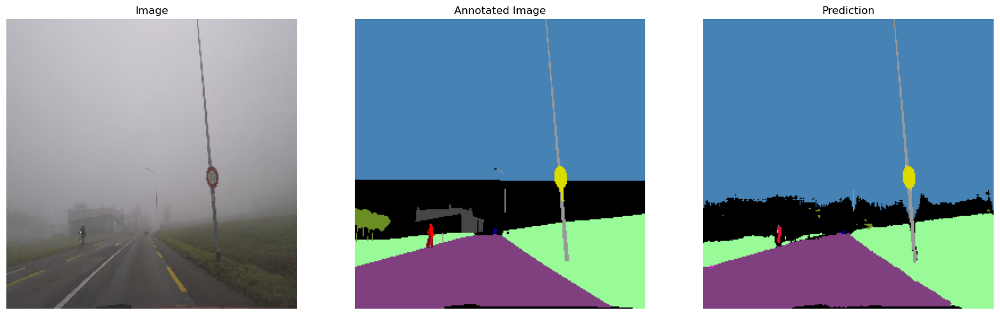

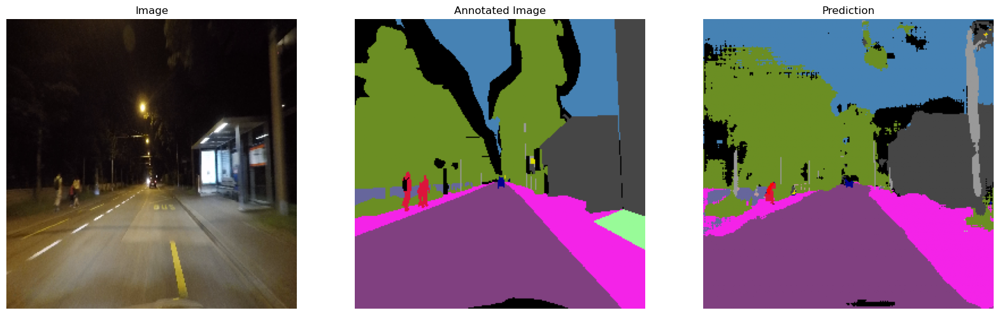

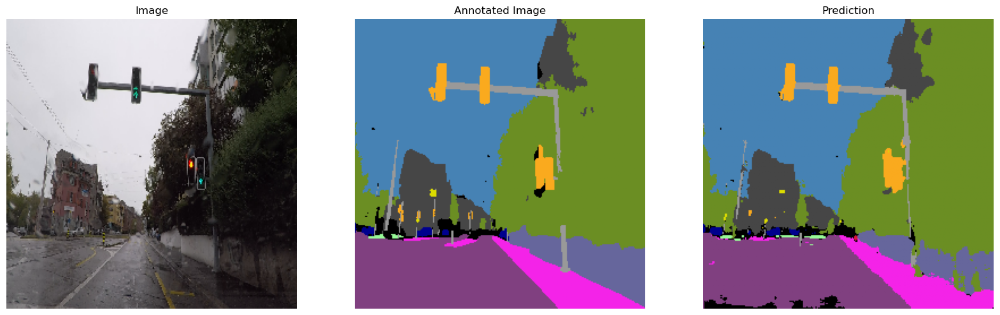

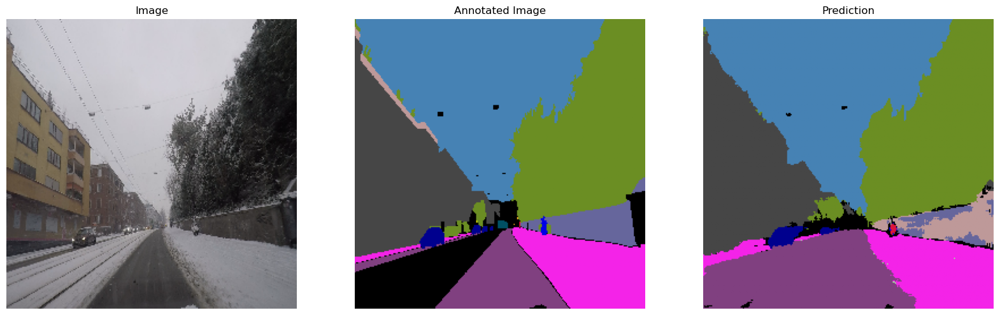

In [54]:
for x in range(0, 5):
    fog_prediction.predict(fog_training_duo[x])
    night_prediction.predict(night_training_duo[x])
    rain_prediction.predict(rain_training_duo[x])
    snow_prediction.predict(snow_training_duo[x])

1/1 [==============================] - 0s 12ms/step


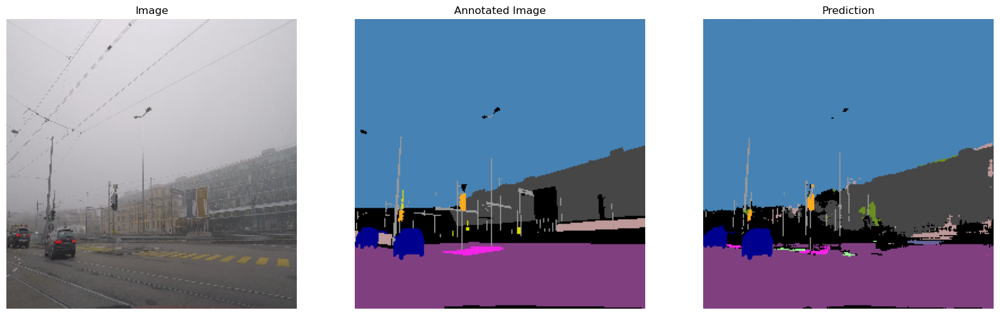

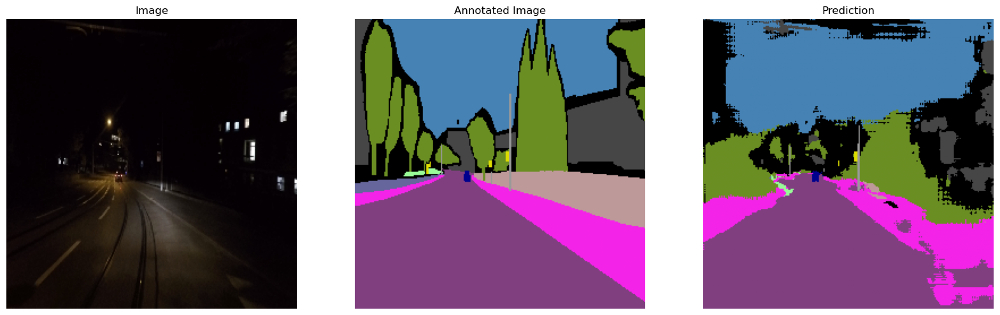

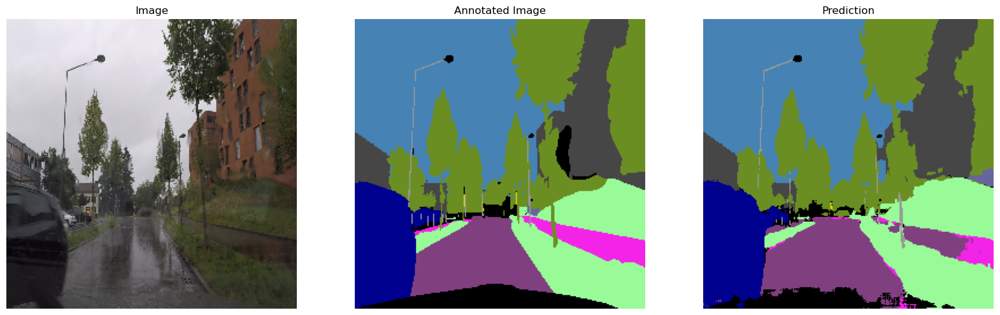

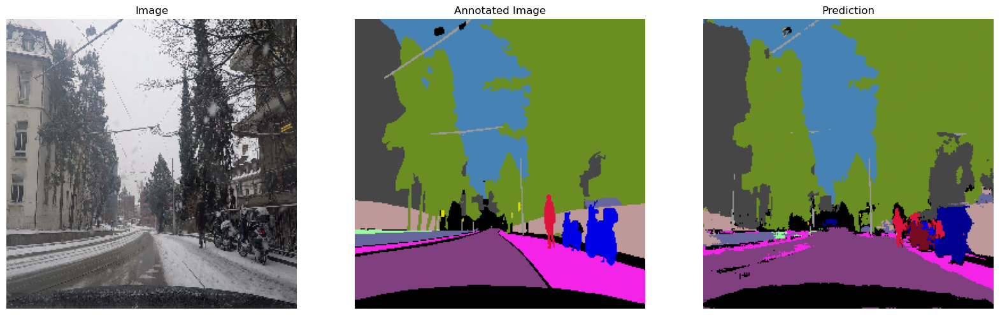

In [55]:
for x in range(0, 5):
    fog_prediction.predict(fog_validation_duo[x])
    night_prediction.predict(night_validation_duo[x])
    rain_prediction.predict(rain_validation_duo[x])
    snow_prediction.predict(snow_validation_duo[x])